# Подключение библиотеки

In [35]:
import os
import pathlib
from datasets import load_dataset, load_from_disk

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import tensorflow as tf

from tensorflow.keras import layers
from tensorflow.keras import models
# from IPython.display import display, Audio 
import IPython.display as ipd

# Set the seed value for experiment reproducibility.
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)

## Загрузка датасет

In [21]:
data_dir = '/home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0'
data_dir

'/home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0'

In [22]:
train_ds, val_ds = tf.keras.utils.audio_dataset_from_directory(
    directory=data_dir,
    batch_size=64,
    validation_split=0.2,
    seed=0,
    output_sequence_length=16000,
    subset='both'
)

Found 519 files belonging to 220 classes.
Using 416 files for training.
Using 103 files for validation.


## Содержимое датасет

In [23]:
# Печатаем информацию о датасете
train_ds.element_spec
print("Number of classes:", len(train_ds.class_names))
print("Class names:", train_ds.class_names)

Number of classes: 220
Class names: ['00', '01', '02', '03', '05', '06', '07', '09', '0a', '0b', '0c', '0d', '0e', '0f', '10', '11', '13', '14', '15', '16', '17', '18', '19', '1b', '1c', '1d', '1e', '1f', '20', '21', '22', '23', '24', '26', '28', '29', '2a', '2b', '2d', '2e', '2f', '30', '31', '32', '34', '35', '36', '37', '38', '39', '3a', '3b', '3c', '3d', '3e', '3f', '40', '41', '42', '43', '44', '46', '47', '49', '4a', '4b', '4c', '4d', '4e', '4f', '51', '52', '53', '54', '55', '57', '58', '59', '5a', '5b', '5c', '5d', '5e', '5f', '60', '61', '62', '63', '65', '67', '69', '6a', '6b', '6c', '6d', '6f', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '7a', '7b', '7c', '7d', '7e', '7f', '80', '81', '82', '83', '84', '86', '87', '88', '89', '8a', '8b', '8c', '8d', '8e', '8f', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '9a', '9b', '9c', '9d', '9e', '9f', 'a0', 'a1', 'a2', 'a3', 'a4', 'a6', 'a7', 'a8', 'a9', 'ab', 'ac', 'ad', 'ae', 'af', 'b0', 'b1', 'b3', 'b6

In [36]:
label_names = []

# Цикл по батчам
for batch in train_ds:
    # Получаем аудио и метки
    audio, labels = batch
    
    # Проходим по каждой метке в батче
    for label, waveform in zip(labels, audio):
        # Получаем каталог для метки
        label_dir = os.path.join(data_dir, f"{label:02x}")
        
        # Проверяем существование каталога
        if not os.path.exists(label_dir):
            print(f"Directory not found: {label_dir}")
            continue
            
        # Получаем список файлов в каталоге
        files = os.listdir(label_dir)
        
        # Проверяем, что есть файлы в каталоге
        if not files:
            print(f"No files found in directory: {label_dir}")
            continue
            
        # Выбираем первый файл, который является текстовым файлом
        text_file = next((file for file in files if file.endswith(".txt")), None)
        
        # Проверяем, что найден текстовый файл
        if text_file is None:
            print(f"No text files found in directory: {label_dir}")
            continue
            
        # Формируем путь к текстовому файлу
        text_file_path = os.path.join(label_dir, text_file)
        
        # Читаем текст из файла
        with open(text_file_path, "r", encoding="utf-8") as file:
            text = file.read()
            # Сохраним тексты для составления сонограммы
            label_names.append(text)
            
        print(f"Label {label}: {text}")
        
        # Выводим аудио
        print("Audio shape:", audio.shape)
        print('Waveform shape:', waveform.shape)
        print('Audio playback')
        ipd.display(ipd.Audio(waveform[:, 0], rate=16000))

Label 172: собеседник уже отказался от предложенной сигары он снова протянул

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 50: время о воскликнул он выдающееся светило так

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 10: но это не

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 125: крупный план на бордовом кожаном диване с портретом

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 97: небрежно взмахнул

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 177: ножа к своему лбу

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 93: соседних кварталов всё получилось так здорово

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 177: ножа к своему лбу

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 22: вульф согласно

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 179: не будет

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 28: то за пределами известной мегасферы

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 94: это оружие

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 134: коснувшись его руки ледяными пальцами хотя внешне был как всегда спокоен

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 93: соседних кварталов всё получилось так здорово

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/cd
Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/d6
Label 7: я всё это

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 84: тоже был сын гриша

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 5: а вам не вредно хе хех артём посмотрите

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 60: относительно брака белого с цветной

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 121: у белорусского вокзала неизвестный быстро

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 35: красивые

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 54: лучшего начала нового года чем нанести ещё один удар

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/50
Label 58: может быть

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 21: какое дело грубо прервала его

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 60: относительно брака белого с цветной

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 46: занятно на моей стороне лидс а кто подтверждает его слова

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 198: хочу сопоставить коекакие даты

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 10: но это не

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 148: был способен убить даже животное

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 168: никто из тех кто сражался в городе не мог рассчитывать на помощь врачей

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 31: война в ираке

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/66
Label 77: действительно холмы метров до тридцати а не халтурные вздутия поднятия в

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 60: относительно брака белого с цветной

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/bf
Label 62: ожидал

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 52: официант уже торопился к столику

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 193: в тайне и не сдержал слово

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 30: в такие

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 2: толстый вельможа

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 82: объясняли гендерсону что он строит машину

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 78: мне было нужно

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 209: скажите ландграф такая безрассудная твага

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 215: пятидесятого года чеканки

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 122: подразделения банковских операций

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/2c
Label 53: неизбежно

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 207: прожив на новом месте почти неделю

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 28: то за пределами известной мегасферы

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 161: камуфляж

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/cd
Label 59: но вряд ли мог оказаться мишенью магии своего нынешнего хозяина лавочники трактирщики коекто из

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 98: боб открыл первый шкаф нет

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 208: забубнил мудрецкий но комбат перебил его молись чтобы эта поездка закончилась без происшествий

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 83: она работает

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/a5
Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/c2
Label 85: учили не считать их

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 103: устроить

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/27
Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/12
Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/08
Label 79: у нас своя посидушка будет

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 118: ясны они ни были

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 160: и пройти днём со знающим человеком платить же придётся тмуторокань княжество сильное

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 108: если бы

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/b2
Label 147: волноваться

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 101: поступал как все люди

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 190: правительство во в мадриде наказало меня

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/1a
Label 123: всё объяснялось одним только словом тайна

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 168: никто из тех кто сражался в городе не мог рассчитывать на помощь врачей

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 29: не рабочий естественно я же буду делать официальное заявление

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/b4
Label 197: огромная дверь напротив лестницы сделанная из цельной стальной плиты

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 212: а температура явно ниже нуля

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 84: тоже был сын гриша

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 157: ненаказуемых поступках не могут считаться основанием для возбуждения уголовного дела вот так

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 158: относящиеся к делу

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 106: винца обычно с ним идут на медведя или

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 211: они могли рассчитывать только на себя

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 103: устроить

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 215: пятидесятого года чеканки

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/45
Label 135: и шабюю дал вам денег

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 105: джоэл закрыл глаза и прислушиваясь

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 73: нет не надо

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 162: тех же платьях что были

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 159: за упырей

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/aa
Label 152: приготовился ждать

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 2: толстый вельможа

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 184: твердостью духа и деятельностью

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 126: пусть ищут

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 140: ей было почти

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 135: и шабюю дал вам денег

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 162: тех же платьях что были

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 71: рассвета в понедельник появился в своем кабинете

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/33
Label 184: твердостью духа и деятельностью

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 202: дурное предзнаменование через два часа бароны

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 17: снова закрылась

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 6: временем этакое ощущение разумной самодостаточности

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/12
Label 208: забубнил мудрецкий но комбат перебил его молись чтобы эта поездка закончилась без происшествий

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 151: хагин засмеялся

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 127: она всё чаще

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 147: волноваться

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 216: слишком это всё сложно как разведчик адмирал прекрасно понимал что это

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 185: в стороны как цыплята

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 159: за упырей

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 196: я слышал как он

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 202: дурное предзнаменование через два часа бароны

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 89: будем доведены до крайности и будем покупать билеты

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 119: мы сидели

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 155: она казалось старалась держаться

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/c9
Label 67: есть деньги надо поехать

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 161: камуфляж

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 129: на них не подействовал

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 164: ох как

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 92: сотрудница авиакомпании заверила его

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/48
Label 199: в окошечке

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/db
Label 166: из раны

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 68: север кивнул

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 175: по информации в первые же дни полученной от проходивших мимо людей там имелась огромная поляна куда легко выйти через узкую лесную полосу разделитель

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 58: может быть

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 103: устроить

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 149: от ворот на другом его

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 52: официант уже торопился к столику

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 23: я не ребенок не хочу чтобы меня носили громко выдохнул и сказал окей поставив мои ноги на пол

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/12
Label 135: и шабюю дал вам денег

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/48
Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/b2
Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/56
Label 19: никак я славка не могу злыдня выследить никто ничего не

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/aa
Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/2c
Label 217: рано ли

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 35: красивые

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 101: поступал как все люди

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/b2
Label 90: мистер гроув как бы в отнесся к подобной перспективе ваш клиент будь он

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 161: камуфляж

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 125: крупный план на бордовом кожаном диване с портретом

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/2c
Label 83: она работает

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 47: после этого дедан перестал отпускать уничижительные замечания на мой счёт и

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 193: в тайне и не сдержал слово

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 60: относительно брака белого с цветной

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/d6
Label 43: у неё есть ответы

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 13: открыли торгсины где только за золото продавались хорошие товары

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 129: на них не подействовал

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 76: нему подался

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 197: огромная дверь напротив лестницы сделанная из цельной стальной плиты

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 101: поступал как все люди

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 218: я ж переводчик вы хотите я с

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 120: сказал я

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 93: соседних кварталов всё получилось так здорово

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 213: долго беспомощно наблюдал как его дорогой друг медленно умирает у него

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 160: и пройти днём со знающим человеком платить же придётся тмуторокань княжество сильное

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 210: развязным был

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 24: сойти за простого клерка

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 161: камуфляж

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 129: на них не подействовал

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 163: ааа да ты никак

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 124: и что произошло вскинулся

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 148: был способен убить даже животное

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 2: толстый вельможа

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/68
Label 148: был способен убить даже животное

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 132: ничего нельзя было поделать

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 78: мне было нужно

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 10: но это не

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 38: помешал свободно наращивать советскую

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 82: объясняли гендерсону что он строит машину

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 164: ох как

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/bd
Label 136: сообщу твои координаты

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 88: постепенно поднимаясь

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 34: с пятиметровой медной фигурой

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/b5
Label 105: джоэл закрыл глаза и прислушиваясь

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 95: во вторых энергия детей заряжала

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/b5
Label 174: занимались какие имели планы на будущее все эти фигуры сняты с доски так вот я собираюсь вернуть их обратно я понимаю так стронг и рейли сделали

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 59: но вряд ли мог оказаться мишенью магии своего нынешнего хозяина лавочники трактирщики коекто из

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/b5
Label 47: после этого дедан перестал отпускать уничижительные замечания на мой счёт и

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 11: у него появилось

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/33
Label 187: даже не раздумывай

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 107: в общем всё обдумать

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 106: винца обычно с ним идут на медведя или

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 196: я слышал как он

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 65:  вульф поднял голову

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 143: на недельку показалось что нашла но быстро выяснилось что

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 94: это оружие

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 162: тех же платьях что были

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 91: но как нам оставаться при этом незамеченными

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 0: прыгай

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 92: сотрудница авиакомпании заверила его

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 193: в тайне и не сдержал слово

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 30: в такие

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 187: даже не раздумывай

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 188: бесстрашно как школа трактовки слов

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 33: во всяком случае можете передать мистеру роллинсу что он

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 3: хотел попросить

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 142: её представлению это делали французские дамы и как хотелось это проделать с пьетро креспи когда

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 216: слишком это всё сложно как разведчик адмирал прекрасно понимал что это

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 30: в такие

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 128: все земные природные царства

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 206: доброе согласие

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 212: а температура явно ниже нуля

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 108: если бы

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 54: лучшего начала нового года чем нанести ещё один удар

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 11: у него появилось

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 138: показав на пальцах примерно сантиметров

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 109: а друзья что

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 122: подразделения банковских операций

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/aa
Label 63: нарушителя и разгильдяя гнать

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/33
Label 193: в тайне и не сдержал слово

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 150: в полуметре от огромной полосы горящего

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/b2
Label 167: тут же два крыла завыли

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 7: я всё это

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 46: занятно на моей стороне лидс а кто подтверждает его слова

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 52: официант уже торопился к столику

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 29: не рабочий естественно я же буду делать официальное заявление

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 54: лучшего начала нового года чем нанести ещё один удар

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 46: занятно на моей стороне лидс а кто подтверждает его слова

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 153: теперь

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/b4
Label 82: объясняли гендерсону что он строит машину

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 57: по тому насколько юра был бледен можно было догадаться о сделанном ему

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 119: мы сидели

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 108: если бы

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 130: неужели вам не совестно паясничать здесь

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 3: хотел попросить

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 105: джоэл закрыл глаза и прислушиваясь

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 125: крупный план на бордовом кожаном диване с портретом

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 187: даже не раздумывай

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 152: приготовился ждать

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 182: хорьку в лицо брызнул

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 149: от ворот на другом его

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 164: ох как

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 65:  вульф поднял голову

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 94: это оружие

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 160: и пройти днём со знающим человеком платить же придётся тмуторокань княжество сильное

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 187: даже не раздумывай

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 79: у нас своя посидушка будет

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/bf
Label 75: буквально через десять секунд васильев ответил дровосек на связи феникс

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 45: мантия чародея была заправлена

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 207: прожив на новом месте почти неделю

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 131: или вырвется из засады

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 176: нет ли за поясом пистолета

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 59: но вряд ли мог оказаться мишенью магии своего нынешнего хозяина лавочники трактирщики коекто из

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/b5
Label 90: мистер гроув как бы в отнесся к подобной перспективе ваш клиент будь он

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 117: себе её влияние

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 96: это мой помощник

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 71: рассвета в понедельник появился в своем кабинете

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 50: время о воскликнул он выдающееся светило так

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 7: я всё это

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 43: у неё есть ответы

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/db
Label 141: мира позволяла им жить комфортно без

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 215: пятидесятого года чеканки

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 83: она работает

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 70: туран и разин

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/25
Label 98: боб открыл первый шкаф нет

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 16: человека имеющего определенную цель

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/08
Label 112: только оторвусь

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 10: но это не

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 171: и начала выворачиваться

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 99: совсем легко и правдоподобно

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/db
Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/04
Label 131: или вырвется из засады

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 148: был способен убить даже животное

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 48: нож рукоятка которого торчала перпендикулярно её рёбрам полностью вошёл

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 195: посмотрите посмотрите

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 190: правительство во в мадриде наказало меня

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 31: война в ираке

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 114: мы продолжаем разговор о том

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/68
Label 85: учили не считать их

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/48
Label 192: мы столкнемся с ними и здесь

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 28: то за пределами известной мегасферы

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 99: совсем легко и правдоподобно

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/c9
Label 50: время о воскликнул он выдающееся светило так

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 197: огромная дверь напротив лестницы сделанная из цельной стальной плиты

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 60: относительно брака белого с цветной

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 128: все земные природные царства

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/64
Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/1a
Label 81: забавный такой персонаж

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 129: на них не подействовал

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 88: постепенно поднимаясь

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 74: того чтобы получить ордер ему понадобится не меньше часа так что я ещё ничего не

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 89: будем доведены до крайности и будем покупать билеты

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/04
Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/d6
Label 209: скажите ландграф такая безрассудная твага

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 73: нет не надо

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 179: не будет

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 113: кончен бал

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 91: но как нам оставаться при этом незамеченными

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 28: то за пределами известной мегасферы

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/50
Label 154: переговорщик зашагал к зданию

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 196: я слышал как он

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 71: рассвета в понедельник появился в своем кабинете

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 92: сотрудница авиакомпании заверила его

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 202: дурное предзнаменование через два часа бароны

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 106: винца обычно с ним идут на медведя или

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 154: переговорщик зашагал к зданию

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 115: и так похоже было что орешек раскололся но оказался пустым я с новой силой стал атаковать её

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 103: устроить

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 140: ей было почти

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 171: и начала выворачиваться

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 212: а температура явно ниже нуля

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 113: кончен бал

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 93: соседних кварталов всё получилось так здорово

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 41: ааа когда ты

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 136: сообщу твои координаты

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 36: он охотился за партийными секретом затем искал

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 139: сказал что он сам выйдет к вам

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 28: то за пределами известной мегасферы

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 13: открыли торгсины где только за золото продавались хорошие товары

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 16: человека имеющего определенную цель

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 131: или вырвется из засады

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 40: снова запуск установки как и в прошлый раз прогнали весь перечень действий по порядку

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 71: рассвета в понедельник появился в своем кабинете

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/db
Label 38: помешал свободно наращивать советскую

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 218: я ж переводчик вы хотите я с

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 1: фоне пылавшего

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 132: ничего нельзя было поделать

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 114: мы продолжаем разговор о том

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 161: камуфляж

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 55: житель квартала сказал бы

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 66: ни сладость я а сложный современный человек

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 203: и вскоре к нему

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 89: будем доведены до крайности и будем покупать билеты

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 139: сказал что он сам выйдет к вам

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 41: ааа когда ты

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 27: свирель выпала

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 12: хочется спать

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 78: мне было нужно

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 16: человека имеющего определенную цель

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 106: винца обычно с ним идут на медведя или

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 204: может быть он хотел

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 121: у белорусского вокзала неизвестный быстро

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 62: ожидал

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 15: ещё долго плавали

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 43: у неё есть ответы

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 147: волноваться

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 87: сцепление заревело как издыхающий бегемот

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/b4
Label 150: в полуметре от огромной полосы горящего

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 134: коснувшись его руки ледяными пальцами хотя внешне был как всегда спокоен

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 0: прыгай

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/12
Label 54: лучшего начала нового года чем нанести ещё один удар

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 119: мы сидели

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/6e
Label 9: при землетрясении

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 96: это мой помощник

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 61: мне сказали что

Audio shape: (64, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 70: туран и разин

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 42: но я всё таки удержался

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 31: война в ираке

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 164: ох как

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/56
Label 112: только оторвусь

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/d6
Label 77: действительно холмы метров до тридцати а не халтурные вздутия поднятия в

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 46: занятно на моей стороне лидс а кто подтверждает его слова

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 148: был способен убить даже животное

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 14: влазьте в о зэ ка

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 68: север кивнул

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 206: доброе согласие

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 131: или вырвется из засады

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 216: слишком это всё сложно как разведчик адмирал прекрасно понимал что это

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 131: или вырвется из засады

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 57: по тому насколько юра был бледен можно было догадаться о сделанном ему

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 20: бастионов с теми

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 204: может быть он хотел

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 40: снова запуск установки как и в прошлый раз прогнали весь перечень действий по порядку

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 112: только оторвусь

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 89: будем доведены до крайности и будем покупать билеты

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 136: сообщу твои координаты

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 67: есть деньги надо поехать

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 49: сейчас он уже считал что действовал столь безрассудно под впечатлением момента радуясь победе над гоблинами

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 195: посмотрите посмотрите

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 94: это оружие

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Directory not found: /home/redalexdad/recognition_speech/buriy_audiobooks_2_val/0/ba
Label 188: бесстрашно как школа трактовки слов

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 218: я ж переводчик вы хотите я с

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 176: нет ли за поясом пистолета

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


Label 3: хотел попросить

Audio shape: (32, 16000, 1)
Waveform shape: (16000, 1)
Audio playback


In [8]:
label_names

['не будет\n',
 'джоэл закрыл глаза и прислушиваясь\n',
 'мы продолжаем разговор о том\n',
 'посмотрите посмотрите\n',
 'учили не считать их\n',
 'лучшего начала нового года чем нанести ещё один удар\n',
 'и начала выворачиваться\n',
 'нет не надо\n',
 'сойти за простого клерка\n',
 'переговорщик зашагал к зданию\n',
 'есть деньги надо поехать\n',
 'нарушителя и разгильдяя гнать\n',
 'объясняли гендерсону что он строит машину\n',
 'на них не подействовал\n',
 'приготовился ждать\n',
 'это мой помощник\n',
 'боб открыл первый шкаф нет\n',
 'мистер гроув как бы в отнесся к подобной перспективе ваш клиент будь он\n',
 'сотрудница авиакомпании заверила его\n',
 'у белорусского вокзала неизвестный быстро\n',
 'в общем всё обдумать\n',
 'относящиеся к делу\n',
 'ожидал\n',
 'будем доведены до крайности и будем покупать билеты\n',
 'я слышал как он\n',
 'и начала выворачиваться\n',
 'может быть\n',
 'война в ираке\n',
 'был способен убить даже животное\n',
 'прожив на новом месте почти неделю

In [9]:
# Выводим первый батч данных
for batch in train_ds.take(1):
    audio, label = batch
    print("Audio shape:", audio.shape)
    print("Label shape:", label.shape)

Audio shape: (64, 16000, 1)
Label shape: (64,)


In [10]:
train_ds.element_spec

(TensorSpec(shape=(None, 16000, None), dtype=tf.float32, name=None),
 TensorSpec(shape=(None,), dtype=tf.int32, name=None))

In [11]:
def squeeze(audio, labels):
  audio = tf.squeeze(audio, axis=-1)
  return audio, labels

train_ds = train_ds.map(squeeze, tf.data.AUTOTUNE)
val_ds = val_ds.map(squeeze, tf.data.AUTOTUNE)

In [12]:
test_ds = val_ds.shard(num_shards=2, index=0)
val_ds = val_ds.shard(num_shards=2, index=1)

In [15]:
for example_audio, example_labels in train_ds.take(1):  
    print(example_audio.shape)
    print(example_labels.shape)

(64, 16000)
(64,)


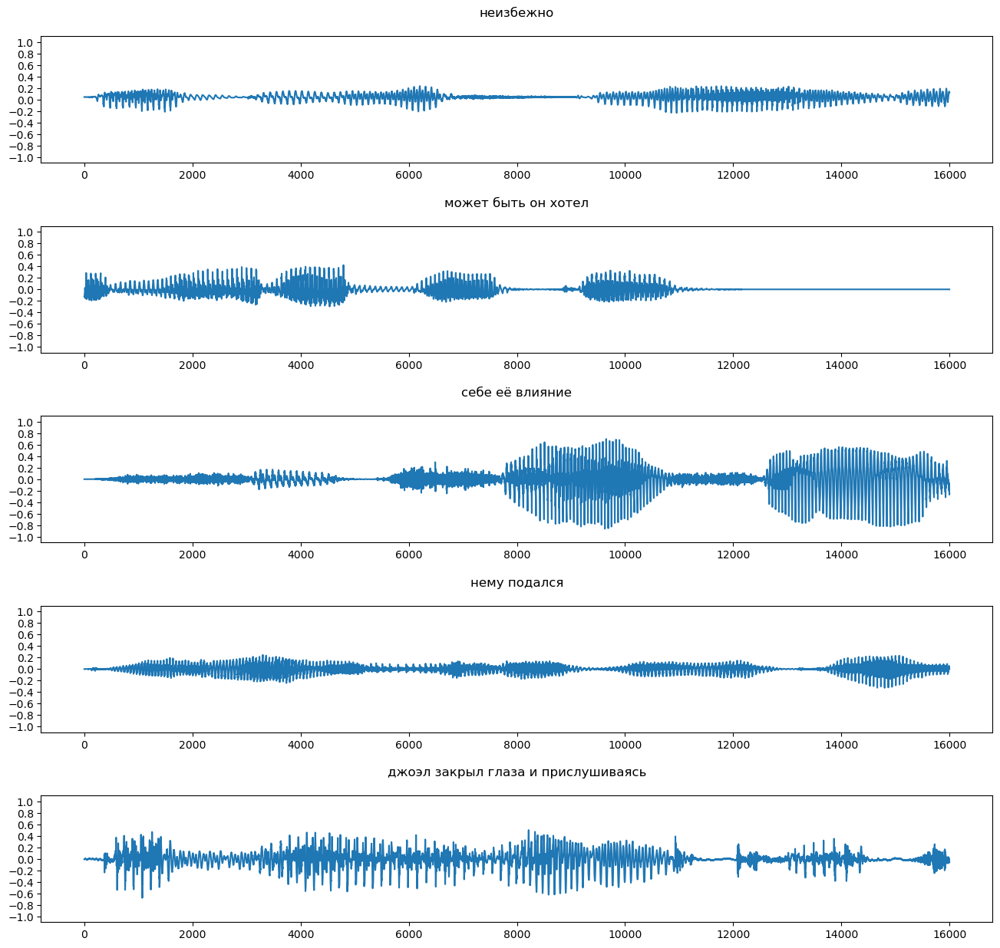

In [16]:
plt.figure(figsize=(16, 15))

rows = 5
cols = 1
n = rows * cols

# Расстояние между подграфиками по вертикали
plt.subplots_adjust(hspace=0.5)

for i in range(n):
  plt.subplot(rows, cols, i+1)
  audio_signal = example_audio[i]
  plt.plot(audio_signal)
  plt.title(label_names[example_labels[i]])
  plt.yticks(np.arange(-1.2, 1.2, 0.2))
  plt.ylim([-1.1, 1.1])

## Преобразование сигналов в спектрограммы

In [17]:
def get_spectrogram(waveform):
  # Convert the waveform to a spectrogram via a STFT.
  spectrogram = tf.signal.stft(
      waveform, frame_length=255, frame_step=128)
  # Obtain the magnitude of the STFT.
  spectrogram = tf.abs(spectrogram)
  # Add a `channels` dimension, so that the spectrogram can be used
  # as image-like input data with convolution layers (which expect
  # shape (`batch_size`, `height`, `width`, `channels`).
  spectrogram = spectrogram[..., tf.newaxis]
  return spectrogram

In [18]:
for i in range(3):
  label = label_names[example_labels[i]]
  waveform = example_audio[i]
  spectrogram = get_spectrogram(waveform)

  print('Label:', label)
  print('Waveform shape:', waveform.shape)
  print('Spectrogram shape:', spectrogram.shape)
  print('Audio playback')
  display.display(display.Audio(waveform, rate=16000))

Label: неизбежно

Waveform shape: (16000,)
Spectrogram shape: (124, 129, 1)
Audio playback


Label: может быть он хотел

Waveform shape: (16000,)
Spectrogram shape: (124, 129, 1)
Audio playback


Label: себе её влияние

Waveform shape: (16000,)
Spectrogram shape: (124, 129, 1)
Audio playback


In [18]:
def plot_spectrogram(spectrogram, ax):
  if len(spectrogram.shape) > 2:
    assert len(spectrogram.shape) == 3
    spectrogram = np.squeeze(spectrogram, axis=-1)
  # Convert the frequencies to log scale and transpose, so that the time is
  # represented on the x-axis (columns).
  # Add an epsilon to avoid taking a log of zero.
  log_spec = np.log(spectrogram.T + np.finfo(float).eps)
  height = log_spec.shape[0]
  width = log_spec.shape[1]
  X = np.linspace(0, np.size(spectrogram), num=width, dtype=int)
  Y = range(height)
  ax.pcolormesh(X, Y, log_spec)

In [19]:
print('Label:', label)
print('Waveform shape:', waveform.shape)
print('Spectrogram shape:', spectrogram.shape)
print('Audio playback')
display.display(display.Audio(waveform, rate=16000))

Label: прыгай

Waveform shape: (16000,)
Spectrogram shape: (124, 129, 1)
Audio playback


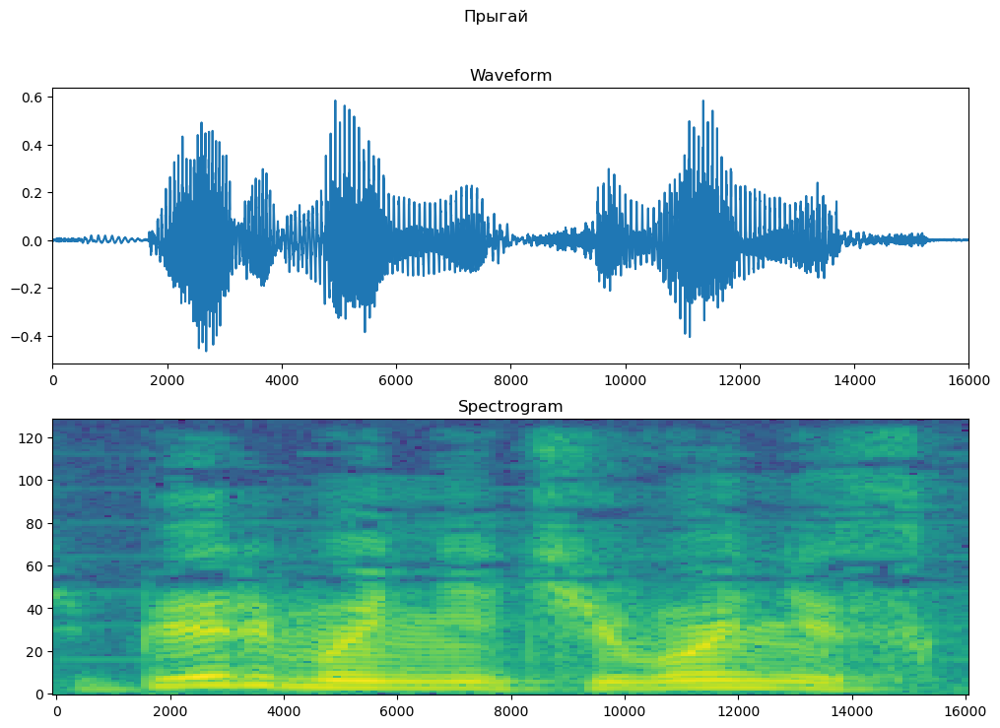

In [20]:
fig, axes = plt.subplots(2, figsize=(12, 8))
timescale = np.arange(waveform.shape[0])
axes[0].plot(timescale, waveform.numpy())
axes[0].set_title('Waveform')
axes[0].set_xlim([0, 16000])

plot_spectrogram(spectrogram.numpy(), axes[1])
axes[1].set_title('Spectrogram')
plt.suptitle(label.title())
plt.show()

In [26]:
def make_spec_ds(ds):
  return ds.map(
      map_func=lambda audio,label: (get_spectrogram(audio), label),
      num_parallel_calls=tf.data.AUTOTUNE)

In [27]:
train_spectrogram_ds = make_spec_ds(train_ds)
val_spectrogram_ds = make_spec_ds(val_ds)
test_spectrogram_ds = make_spec_ds(test_ds)

In [28]:
for example_spectrograms, example_spect_labels in train_spectrogram_ds.take(1):
  break

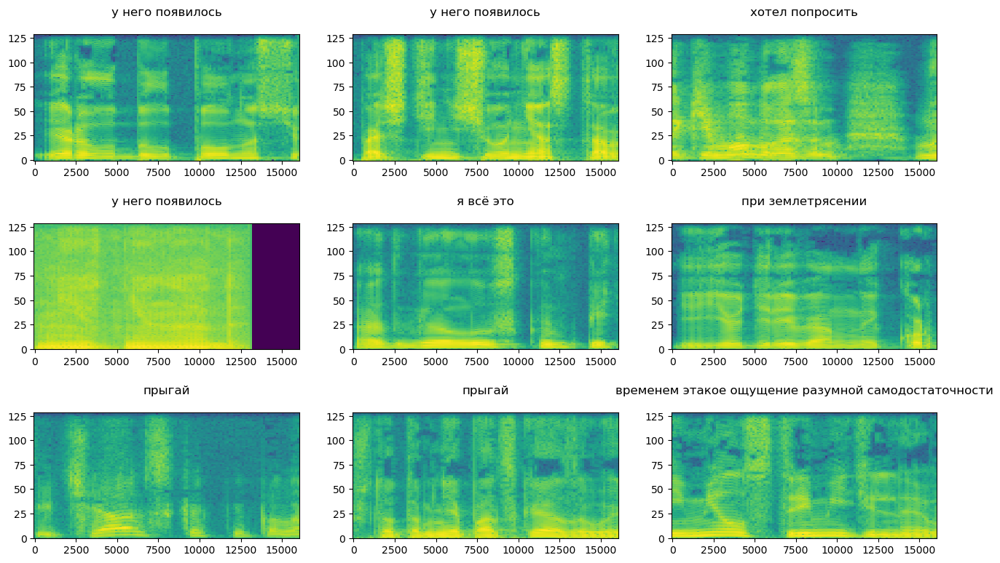

In [30]:
rows = 3
cols = 3
n = rows*cols
fig, axes = plt.subplots(rows, cols, figsize=(16, 9))

# Расстояние между подграфиками по вертикали
plt.subplots_adjust(hspace=0.5)

for i in range(n):
    r = i // cols
    c = i % cols
    ax = axes[r][c]
    plot_spectrogram(example_spectrograms[i].numpy(), ax)
    ax.set_title(label_names[example_spect_labels[i].numpy()])

plt.show()

## Обучение модели

In [31]:
train_spectrogram_ds = train_spectrogram_ds.cache().shuffle(10000).prefetch(tf.data.AUTOTUNE)
val_spectrogram_ds = val_spectrogram_ds.cache().prefetch(tf.data.AUTOTUNE)
test_spectrogram_ds = test_spectrogram_ds.cache().prefetch(tf.data.AUTOTUNE)

In [32]:
input_shape = example_spectrograms.shape[1:]
print('Input shape:', input_shape)
num_labels = len(label_names)

Input shape: (124, 129, 1)


In [33]:
# Instantiate the `tf.keras.layers.Normalization` layer.
norm_layer = layers.Normalization()
# Fit the state of the layer to the spectrograms
# with `Normalization.adapt`.
norm_layer.adapt(data=train_spectrogram_ds.map(map_func=lambda spec, label: spec))

model = models.Sequential([
    layers.Input(shape=input_shape),
    # Downsample the input.
    layers.Resizing(32, 32),
    # Normalize.
    norm_layer,
    layers.Conv2D(32, 3, activation='relu'),
    layers.Conv2D(64, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Dropout(0.25),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(num_labels),
])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_1 (Resizing)       (None, 32, 32, 1)         0         
                                                                 
 normalization_1 (Normaliza  (None, 32, 32, 1)         3         
 tion)                                                           
                                                                 
 conv2d_2 (Conv2D)           (None, 30, 30, 32)        320       
                                                                 
 conv2d_3 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 14, 14, 64)        0         
 g2D)                                                            
                                                                 
 dropout_2 (Dropout)         (None, 14, 14, 64)       

In [34]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'],
)

In [35]:
EPOCHS = 10
history = model.fit(
    train_spectrogram_ds,
    validation_data=val_spectrogram_ds,
    epochs=EPOCHS,
    callbacks=tf.keras.callbacks.EarlyStopping(verbose=1, patience=2),
)

Epoch 1/10


2024-02-27 14:40:11.647526: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_1/dropout_2/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-02-27 14:40:12.051760: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2024-02-27 14:40:12.965103: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f5ad4d35e80 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-02-27 14:40:12.965155: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce GTX 1650 Ti, Compute Capability 7.5
2024-02-27 14:40:12.969418: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1709034013.071705   45775 device_compiler.h:186] Compiled cluster u

99/99 [==============================] - 5s 19ms/step - loss: 3.4996 - accuracy: 0.0594 - val_loss: 2.7996 - val_accuracy: 0.0612
Epoch 2/10
99/99 [==============================] - 1s 13ms/step - loss: 2.8366 - accuracy: 0.0631 - val_loss: 2.7909 - val_accuracy: 0.0599
Epoch 3/10
99/99 [==============================] - 1s 13ms/step - loss: 2.8182 - accuracy: 0.0664 - val_loss: 2.7856 - val_accuracy: 0.0651
Epoch 4/10
99/99 [==============================] - 1s 13ms/step - loss: 2.8025 - accuracy: 0.0653 - val_loss: 2.7822 - val_accuracy: 0.0612
Epoch 5/10
99/99 [==============================] - 1s 13ms/step - loss: 2.7924 - accuracy: 0.0726 - val_loss: 2.7802 - val_accuracy: 0.0729
Epoch 6/10
99/99 [==============================] - 1s 13ms/step - loss: 2.7781 - accuracy: 0.0860 - val_loss: 2.7908 - val_accuracy: 0.0573
Epoch 7/10
99/99 [==============================] - 1s 13ms/step - loss: 2.7744 - accuracy: 0.0785 - val_loss: 2.8038 - val_accuracy: 0.0586
Epoch 7: early stopping


Text(0, 0.5, 'Accuracy [%]')

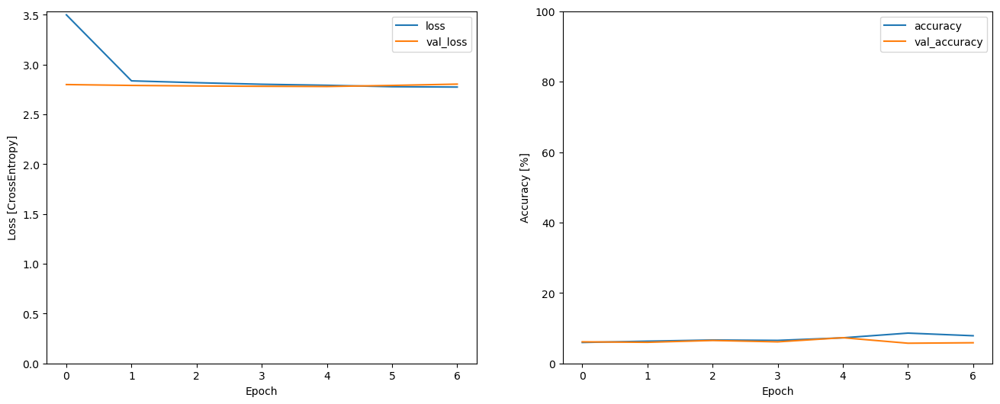

In [36]:
metrics = history.history
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(history.epoch, metrics['loss'], metrics['val_loss'])
plt.legend(['loss', 'val_loss'])
plt.ylim([0, max(plt.ylim())])
plt.xlabel('Epoch')
plt.ylabel('Loss [CrossEntropy]')

plt.subplot(1,2,2)
plt.plot(history.epoch, 100*np.array(metrics['accuracy']), 100*np.array(metrics['val_accuracy']))
plt.legend(['accuracy', 'val_accuracy'])
plt.ylim([0, 100])
plt.xlabel('Epoch')
plt.ylabel('Accuracy [%]')